In [ ]:
import tensorflow as tf
print(tf.__version__)

raw_dataset = tf.data.TFRecordDataset("/content/94-img.tfrecord")

number_of_records = 1

for raw_record in raw_dataset.take(number_of_records):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())
    print(example)
    print("_____________________________ next _________________________________\n")

In [ ]:
raw_dataset = tf.data.TFRecordDataset("/content/18-img.tfrecord")

number_of_records = 1

for raw_record in raw_dataset.take(number_of_records):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())
    print(example)
    print("_____________________________ next _________________________________\n")

In [ ]:
raw_dataset = tf.data.TFRecordDataset("/content/101-img.tfrecord")

number_of_records = 1

for raw_record in raw_dataset.take(number_of_records):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())
    print(example)
    print("_____________________________ next _________________________________\n")

In [ ]:
#Combine multiple tfrecord files
list_of_tfrecord_files = ["/content/101-img.tfrecord", "/content/18-img.tfrecord" ,"/content/94-img.tfrecord"]

dataset = tf.data.TFRecordDataset(list_of_tfrecord_files)

# Save dataset to .tfrecord file
filename = 'combinedwithold.tfrecord'

writer = tf.data.experimental.TFRecordWriter(filename)
writer.write(dataset)

In [ ]:
raw_dataset = tf.data.TFRecordDataset("/content/combinedwithold.tfrecord")

number_of_records = 1

for raw_record in raw_dataset.take(number_of_records):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())
    print(example)
    print("_____________________________ next _________________________________\n")

In [ ]:
sum(1 for _ in tf.data.TFRecordDataset("/content/combinedwithold.tfrecord"))

In [ ]:
DATASET_SIZE = 213
input_file = "/content/combinedwithold.tfrecord"

train_size = int(0.85 * DATASET_SIZE)
val_size = int(0.15 * DATASET_SIZE)


full_dataset = tf.data.TFRecordDataset(input_file)
full_dataset = full_dataset.shuffle(buffer_size=119)

train_dataset = full_dataset.take(train_size)
val_dataset = full_dataset.skip(train_size)


In [ ]:
writer = tf.data.experimental.TFRecordWriter(f"train.tfrecord")
writer.write(train_dataset)
writer = tf.data.experimental.TFRecordWriter(f"val.tfrecord")
writer.write(val_dataset)

In [ ]:
def give_sum_of_records(file_path):
  print("File name: ",file_path.split("/")[-1])
  print(sum(1 for _ in tf.data.TFRecordDataset(file_path)))

give_sum_of_records("/content/train.tfrecord")
give_sum_of_records("/content/val.tfrecord")

In [2]:
!pip install tensorflow_gpu==1.15

## Configs and Hyperparameters

Support a variety of models, you can find more pretrained model from [Tensorflow detection model zoo: COCO-trained models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md#coco-trained-models), as well as their pipline config files in [object_detection/samples/configs/](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

In [1]:
import numpy as np
import tensorflow as tf
tf.__version__

'1.15.0'

In [3]:
# If you forked the repo, you can replace the link.
repo_url = 'https://github.com/roboflow-ai/tensorflow-object-detection-faster-rcnn'

# Number of training steps - 1000 will train very quickly, but more steps will increase accuracy.
num_steps = 5000  # 200000 to improve

# Number of evaluation steps.
#num_eval_steps = 50

MODELS_CONFIG = {
        'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
        'pipeline_file': 'demo.config',
        'batch_size': 1
    }
}

# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'faster_rcnn_inception_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

## Clone the `tensorflow-object-detection` repository or your fork.

In [4]:
import os

%cd /content

repo_dir_path = os.path.abspath(os.path.join('.', os.path.basename(repo_url)))

!git clone {repo_url}
%cd {repo_dir_path}
!git pull

/content
Cloning into 'tensorflow-object-detection-faster-rcnn'...
remote: Enumerating objects: 885, done.
remote: Total 885 (delta 0), reused 0 (delta 0), pack-reused 885
Receiving objects: 100% (885/885), 24.84 MiB | 36.75 MiB/s, done.
Resolving deltas: 100% (412/412), done.
/content/tensorflow-object-detection-faster-rcnn
Already up to date.


In [5]:
!pip install tf_slim

     |████████████████████████████████| 358kB 5.1MB/s 


## Install required packages

In [6]:
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git

!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib
!pip install -q pycocotools
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'

!python object_detection/builders/model_builder_test.py


/content
Selecting previously unselected package python-bs4.
(Reading database ... 144676 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpa

## Prepare `tfrecord` files
1) Train dataset should be inside /content/tensorflow-object-detection-faster-rcnn/data/ folder.

rename it as data.record and demo.pbtxt

2) Create a "eval" folder inside /content/tensorflow-object-detection-faster-rcnn/data/

3) Eval dataset should be inside /content/tensorflow-object-detection-faster-rcnn/data/eval/ folder.

rename it as data.record and demo.pbtxt

In [8]:
%cd /content/tensorflow-object-detection-faster-rcnn/data

/content/tensorflow-object-detection-faster-rcnn/data


In [9]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
train_record_fname = '/content/tensorflow-object-detection-faster-rcnn/data/data.record'
label_map_pbtxt_fname = '/content/tensorflow-object-detection-faster-rcnn/data/demo.pbtxt'

## Download base model

In [10]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)

/content/models/research


In [11]:
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

/content/models/research/pretrained_model
total 111M
drwxr-xr-x  3 345018 5000 4.0K Feb  1  2018 .
drwxr-xr-x 24 root   root 4.0K Sep 19 14:32 ..
-rw-r--r--  1 345018 5000   77 Feb  1  2018 checkpoint
-rw-r--r--  1 345018 5000  55M Feb  1  2018 frozen_inference_graph.pb
-rw-r--r--  1 345018 5000  51M Feb  1  2018 model.ckpt.data-00000-of-00001
-rw-r--r--  1 345018 5000  16K Feb  1  2018 model.ckpt.index
-rw-r--r--  1 345018 5000 5.5M Feb  1  2018 model.ckpt.meta
-rw-r--r--  1 345018 5000 3.2K Feb  1  2018 pipeline.config
drwxr-xr-x  3 345018 5000 4.0K Feb  1  2018 saved_model


In [12]:
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'/content/models/research/pretrained_model/model.ckpt'

## Configuring a Training Pipeline

In [13]:
import os
pipeline_fname = os.path.join('/content/models/research/object_detection/samples/configs/', pipeline_file)
print(pipeline_fname)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

/content/models/research/object_detection/samples/configs/demo.config


In [14]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

num_classes = get_num_classes(label_map_pbtxt_fname)

In [15]:
!cat {pipeline_fname}

model {
  faster_rcnn {
    num_classes: 4
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 600
        max_dimension: 1024
      }
    }
    feature_extractor {
      type: 'faster_rcnn_inception_v2'
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        random_normal_intializer{
          mean: 1 
          stddev: 0.5
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.5
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 14
    maxpool_kernel_si

In [16]:
train_dir = 'training/'
# Optionally remove content in output model directory to fresh start.
!rm -rf {train_dir}
os.makedirs(train_dir, exist_ok=True)

In [17]:
pwd

'/content/models/research'

## Train the model

In [20]:
!python /content/models/research/object_detection/legacy/train.py \
--pipeline_config_path=/content/models/research/object_detection/samples/configs/demo.config \
--train_dir=/content/models/research/training/ \
--alsologtostderr

Streaming output truncated to the last 5000 lines.
I0919 15:07:43.647245 140343717492608 learning.py:512] global step 9508: loss = 0.0844 (0.175 sec/step)
INFO:tensorflow:global step 9509: loss = 0.0872 (0.156 sec/step)
I0919 15:07:43.804238 140343717492608 learning.py:512] global step 9509: loss = 0.0872 (0.156 sec/step)
INFO:tensorflow:global step 9510: loss = 0.0591 (0.144 sec/step)
I0919 15:07:43.949925 140343717492608 learning.py:512] global step 9510: loss = 0.0591 (0.144 sec/step)
INFO:tensorflow:global step 9511: loss = 0.0277 (0.170 sec/step)
I0919 15:07:44.124619 140343717492608 learning.py:512] global step 9511: loss = 0.0277 (0.170 sec/step)
INFO:tensorflow:global step 9512: loss = 0.0162 (0.172 sec/step)
I0919 15:07:44.298376 140343717492608 learning.py:512] global step 9512: loss = 0.0162 (0.172 sec/step)
INFO:tensorflow:global step 9513: loss = 0.0936 (0.178 sec/step)
I0919 15:07:44.477974 140343717492608 learning.py:512] global step 9513: loss = 0.0936 (0.178 sec/step)


In [21]:
%reload_ext tensorboard
%cd /content/models/research/
%tensorboard --logdir "training"

/content/models/research


In [22]:
!ls {train_dir}


checkpoint
events.out.tfevents.1600526374.f14e331907e7
graph.pbtxt
model.ckpt-0.data-00000-of-00001
model.ckpt-0.index
model.ckpt-0.meta
model.ckpt-10188.data-00000-of-00001
model.ckpt-10188.index
model.ckpt-10188.meta
model.ckpt-12000.data-00000-of-00001
model.ckpt-12000.index
model.ckpt-12000.meta
model.ckpt-2735.data-00000-of-00001
model.ckpt-2735.index
model.ckpt-2735.meta
model.ckpt-6510.data-00000-of-00001
model.ckpt-6510.index
model.ckpt-6510.meta
pipeline.config


In [ ]:
print("Do not disconnect")

# Now for Eval part, Steps:

1) Create a "eval" folder inside training folder. 

2) Then run the eval.py command (below).

3) Then run the tensorboard again using 


%reload_ext tensorboard

%cd /content/models/research/

%tensorboard --logdir "training"


# Note: Both the logs for training and eval will be in the single tensorboard.


In [ ]:
!python /content/models/research/object_detection/legacy/eval.py \
--logtostderr  \
--pipeline_config_path=/content/models/research/object_detection/samples/configs/demo.config \
--checkpoint_dir=/content/models/research/training/  \
--eval_dir=/content/models/research/training/eval

## Exporting a Trained Inference Graph
Once your training job is complete, you need to extract the newly trained inference graph, which will be later used to perform the object detection. This can be done as follows:

In [23]:
import re
import numpy as np

output_directory = './fine_tuned_model'

lst = os.listdir(train_dir)
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join(train_dir, last_model)
print(last_model_path)
!python /content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path={pipeline_fname} \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}

training/model.ckpt-12000
Instructions for updating:
Please use `layer.__call__` method instead.
W0919 15:15:39.339833 139665729832832 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:2802: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:Scale of 0 disables regularizer.
I0919 15:15:40.625653 139665729832832 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
I0919 15:15:40.774215 139665729832832 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0919 15:15:40.774696 139665729832832 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0919 15:15:40.835814

In [24]:
!ls {output_directory}

checkpoint			model.ckpt.index  saved_model
frozen_inference_graph.pb	model.ckpt.meta
model.ckpt.data-00000-of-00001	pipeline.config


## Download the model `.pb` file

In [25]:
import os

pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)

In [26]:
!ls -alh {pb_fname}

-rw-r--r-- 1 root root 50M Sep 19 15:15 /content/models/research/fine_tuned_model/frozen_inference_graph.pb


# Testing:

Create test folder inside data folder. Upload the test images in test folder.

# Note: I have used the same images for testing, which are in the train.record file (train dataset). You have to upload your test images (that are outside of train and eval datasets)

In [32]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR =  os.path.join(repo_dir_path, "data/test")

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS[0],len(TEST_IMAGE_PATHS))
print(label_map_pbtxt_fname)

/content/tensorflow-object-detection-faster-rcnn/data/test/Invoice_126_24.jpg 41
/content/tensorflow-object-detection-faster-rcnn/data/demo.pbtxt


In [28]:
%cd /content/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops


# This is needed to display the images.
%matplotlib inline


from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util

/content/models/research/object_detection


In [33]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.01), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict

In [30]:
# Output images not showing? Run this cell again, and try the cell above
# This is needed to display the images.
%matplotlib inline

{'num_detections': 4, 'detection_boxes': array([[0.0014914 , 0.40860367, 0.01919203, 0.66698796],
       [0.4428352 , 0.02723241, 0.47095308, 0.69882894],
       [0.03086922, 0.40931597, 0.04664493, 0.6880371 ],
       [0.20096555, 0.287072  , 0.2187382 , 0.43159088],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32), 'detection_scores': array([0.99991226, 0.99987257, 0.9996123 , 0.9991499 , 0.        ],
      dtype=float32), 'detection_classes': array([1, 4, 2, 3, 1], dtype=uint8)}
{'num_detections': 4, 'detection_boxes': array([[0.21650426, 0.34471503, 0.23972662, 0.4712324 ],
       [0.72788185, 0.58895296, 0.7524937 , 0.75620496],
       [0.21511155, 0.5609793 , 0.2392772 , 0.6982182 ],
       [0.24226141, 0.56327087, 0.26178035, 0.75628215],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32), 'detection_scores': array([0.9996164 , 0.99883324, 0.9987451 , 0.9976459 , 0.        ],
      dtype=float32), 'detection_classes': array([3, 4, 1,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


{'num_detections': 4, 'detection_boxes': array([[0.9309175 , 0.59235454, 0.96476495, 0.84572196],
       [0.4595942 , 0.04083313, 0.4884156 , 0.32019493],
       [0.4667709 , 0.5889892 , 0.4987049 , 0.8025838 ],
       [0.5096551 , 0.5892549 , 0.53354365, 0.9125183 ],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32), 'detection_scores': array([0.9956677, 0.979625 , 0.5827494, 0.2359793, 0.       ],
      dtype=float32), 'detection_classes': array([4, 3, 1, 2, 1], dtype=uint8)}
{'num_detections': 4, 'detection_boxes': array([[0.3361524 , 0.13921559, 0.359494  , 0.45981455],
       [0.7794278 , 0.15307276, 0.81422967, 0.87988335],
       [0.6085735 , 0.15123247, 0.62814826, 0.83185685],
       [0.3376937 , 0.13426922, 0.35971564, 0.46201283],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32), 'detection_scores': array([0.6712179 , 0.4057487 , 0.07592809, 0.02781631, 0.        ],
      dtype=float32), 'detection_classes': array([2, 4, 1, 3, 1

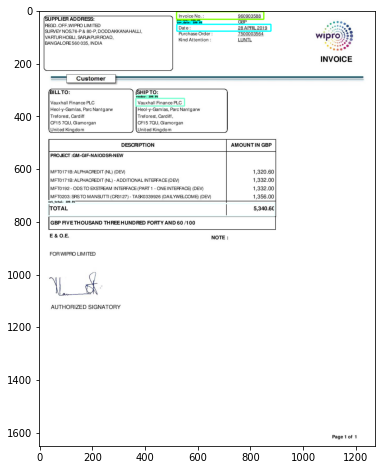

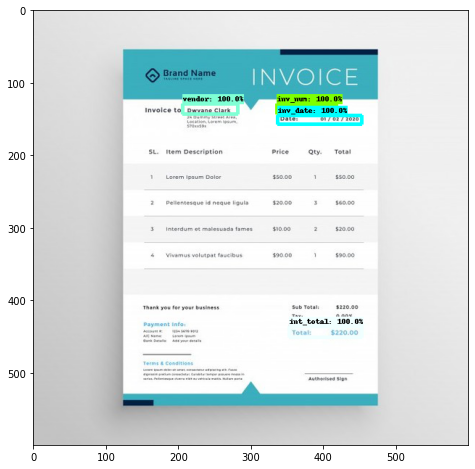

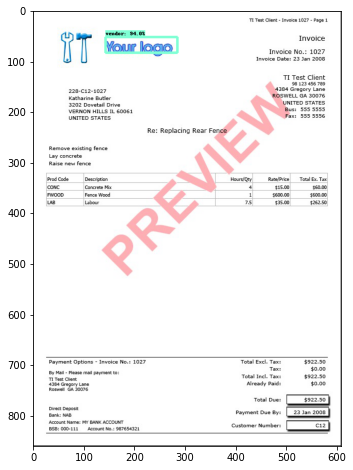

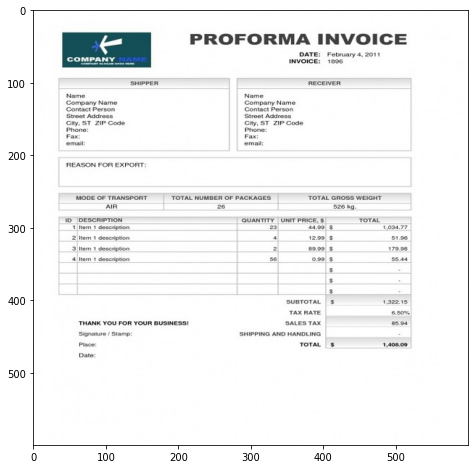

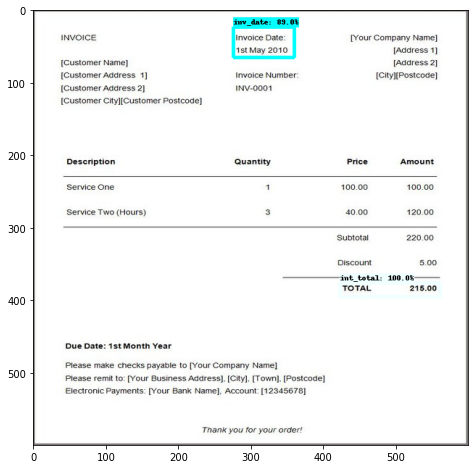

...

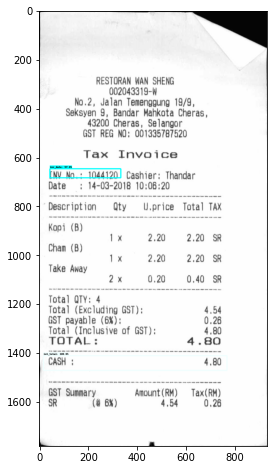

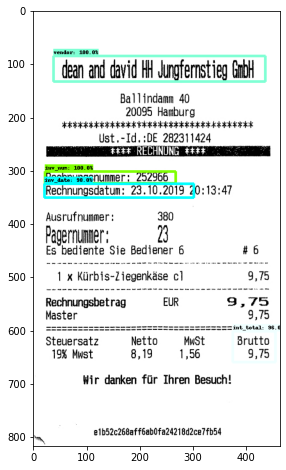

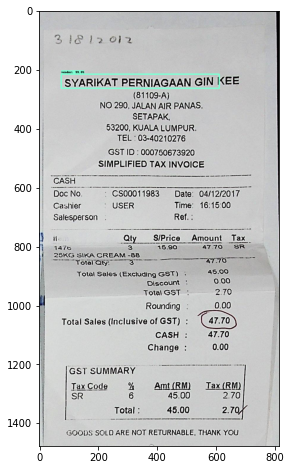

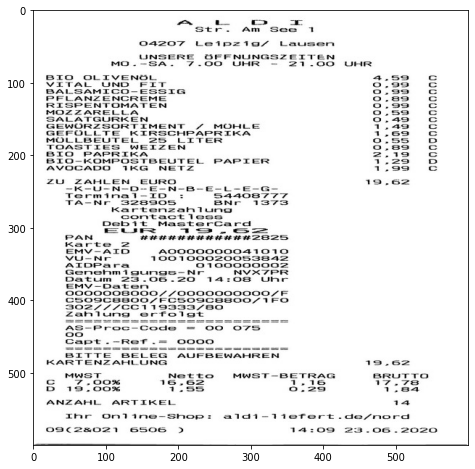

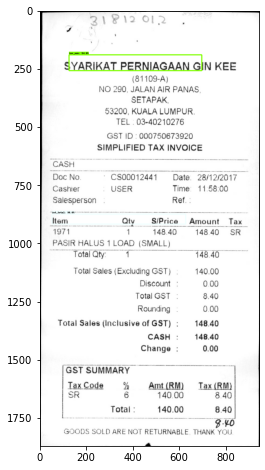

In [34]:
for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=5)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)
    print(output_dict)

In [ ]:
%cd /content/models/research/

%tensorboard --logdir "training"